# Advanced Lane Finding

Task: Write a software pipeline to identify the lane boundaries in a video.

* Compute the camera calibration matrix & distortion coefficients given a set of chessboard images
* Apply a distortion correction to raw images
* Use color transforms, gradients, etc to create a thresholded binary image
* Apply a perspective transform to rectify binary image (birds-eye view)
* Detect lane pixels & fit to find the lane boundary
* Determine the curvature of the lane & vehicle position with respect to center
* Warp the detected lane boundaries back onto the original image
* Output visual display of the lane boundaries & numerical estimation of lane curvature & vehicle position

### Import libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
import glob

%matplotlib inline

## Camera calibration and distortion correction
Here we compute the camera calibration matrix & destortion coefficients, given a set of chessboard images.

### Get image and object points
First step: Read in calibration images of a chessboard. Use at least 20 images to get a reliable calibration. Each chessboard has 9 x 6 corners to detect.

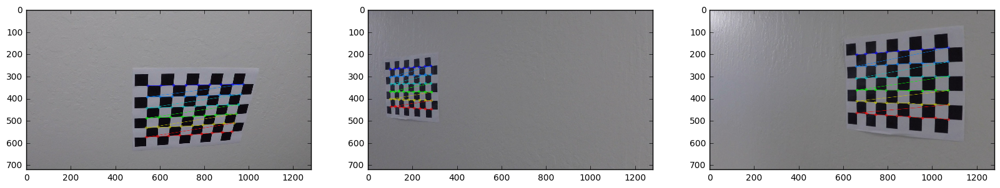

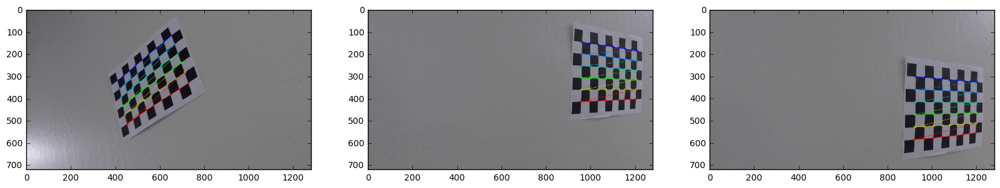

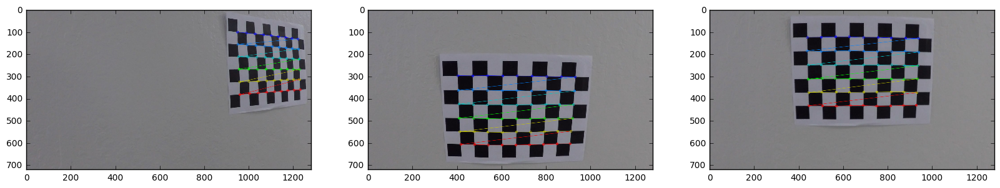

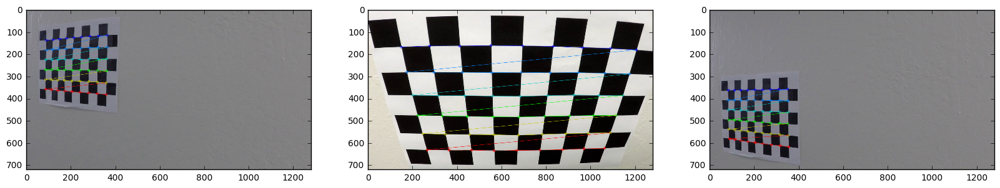

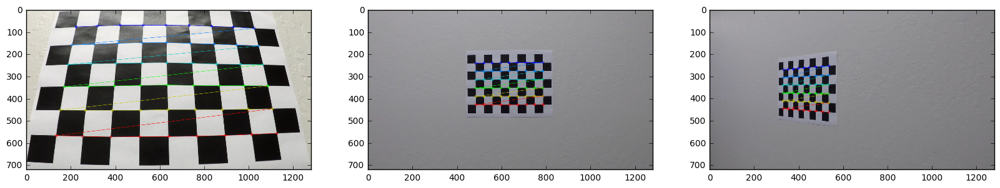

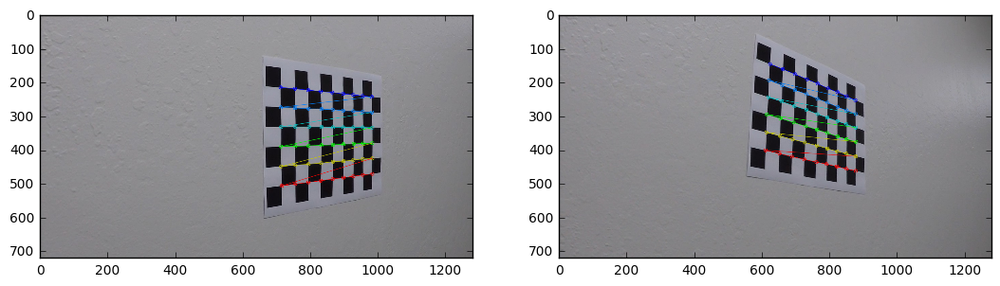

In [2]:
# Read in and make a list of calibration images.
# The glob API helps read in images with a consistent file name
image_file_names = glob.glob('camera_cal/calibration*.jpg')

# Map the coordinates of the corners in this 2D image (called its image points)
# to the 3D coordinates of the real, undistorted chessboard corners (called object points).
# Set up two empty arrays to hold these points:

# Arrays to store object points and image points from all the images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# Prepare object points, like (0, 0, 0), (1, 0, 0), (2, 0, 0), ..., (8, 5, 0)
objp = np.zeros((9*6, 3), np.float32)
# Z coordinate stays zero, but for x, y generate coordinates:
# mgrid returns the coordinate values for a given grid size. Reshape
# those grids back into two columns
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x, y coordinates

# Loop through all image files, detecting corners and appending points to
# the object and image points arrays.
i = 0
for fname in image_file_names:
    # Next, to create the image points, I want to look at the distorted calibration
    # image and detect the corners of the board.
    image = mpimg.imread(fname)

    # Convert image to grayscale (has to be grayscale for next function)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    # Takes in grayscale image along with the dimensions of the chessboard
    # corners (here: 9 x 6)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    # If corners are found, add object points, image points
    if ret == True:
        if (i%3 == 0):
            plt.figure(figsize = (20, 20))
        plt.subplot(1,3,i%3+1)
        imgpoints.append(corners)
        # Object points will be the same for all calibration images, since they
        # represent a real chessboard.
        objpoints.append(objp)

        # draw and display the corners
        image = cv2.drawChessboardCorners(image, (9, 6), corners, ret)
        plt.imshow(image)
        if (i%3 == 2):
            plt.show()
        i += 1

### Perform camera calibration

Take image, object points, and image points. Calculate distortion coefficients (dist) and camera matrix (mtx). Perform camera calibration and image distortion correction, and return the undistorted image (undist).

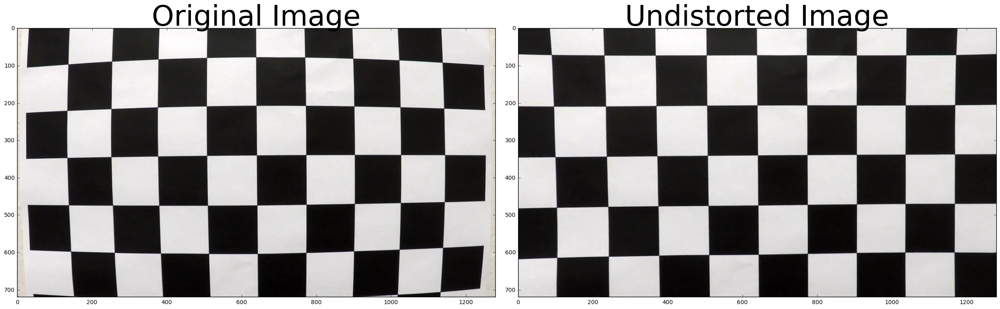

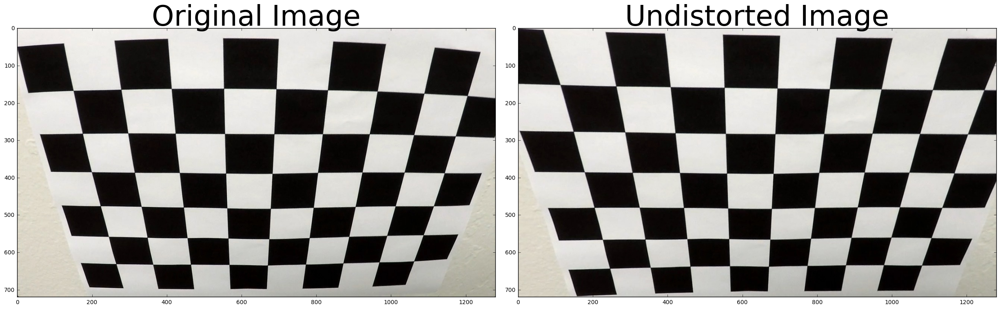

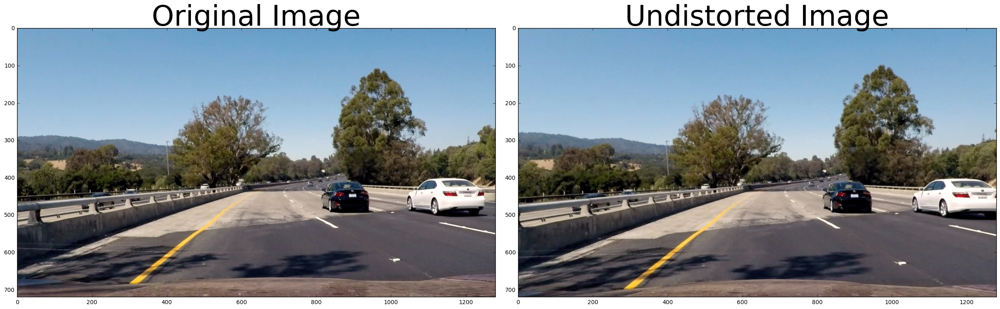

In [14]:
# Calibrates camera
ret, MTX, DIST, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, 
                                                   image.shape[0:2], None, None)
# Undistorts images
def cal_undistort(img):
    undist = cv2.undistort(img, MTX, DIST, None, MTX)
    return undist

image_file = 'camera_cal/calibration1.jpg'
image = mpimg.imread(image_file)
undistorted = cal_undistort(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

image_file = 'camera_cal/calibration2.jpg'
image = mpimg.imread(image_file)
undistorted = cal_undistort(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

image_file = 'test_images/test4.jpg'
image = mpimg.imread(image_file)
undistorted = cal_undistort(image)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Use color transforms, gradients, etc to create a thresholded binary image

Now that we have a way to undistort our images, it's time to start detecting lane lines. We will do that with:

* color transforms
* gradients (absolute values, magnitude, direction)

The goal is to detect lane lines, no matter their color (white, yellow), the light situation (shadows, bright day), and the surrounding objects.

In [15]:
# Function applies Sobel x and y, then takes the absolute value of
# the gradient and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude
    # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Function applies Sobel x and y, then computes the magnitude of
# the gradient and applies a threshold.
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    magn_sobel = np.sqrt(np.power(sobelx, 2) + np.power(sobely, 2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255 * magn_sobel / np.max(magn_sobel))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Function applies Sobel x and y, then computes the direction of
# the gradient and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    directions = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    scaled_sobel = directions
    binary_output = np.zeros_like(scaled_sobel)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output


In [16]:
# The S channel is the best solution - it is cleaner than the H channel result
# and a bit better than the R channel or simple grayscaling.
def hls_select(img, thresh=(0, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Apply a threshold to the S channel
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary

# Let's also use the R channel to detect lines
def rgb_select(img, thresh=(0, 255)):
    # Extract the R channel
    R = img[:,:,0]
    # Apply a similar threshold to find lane-line pixels
    binary = np.zeros_like(R)
    binary[((R > thresh[0]) & (R <= thresh[1]))] = 1
    return binary


First, let's use the S channel and R channels only to detect lanes

Let's look at the best S thresholds


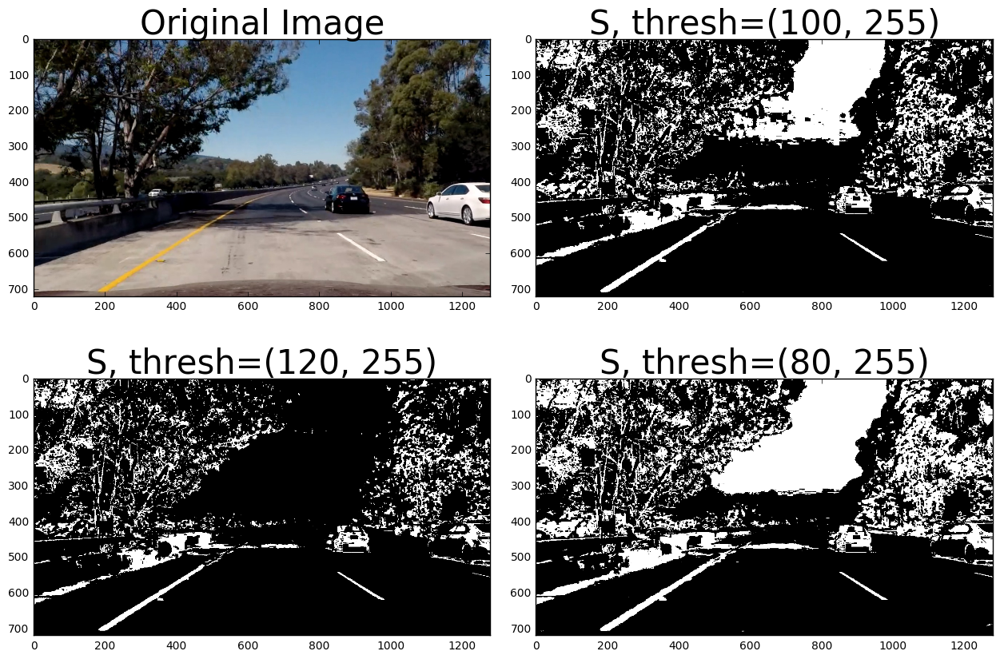

Let's look at the best R thresholds


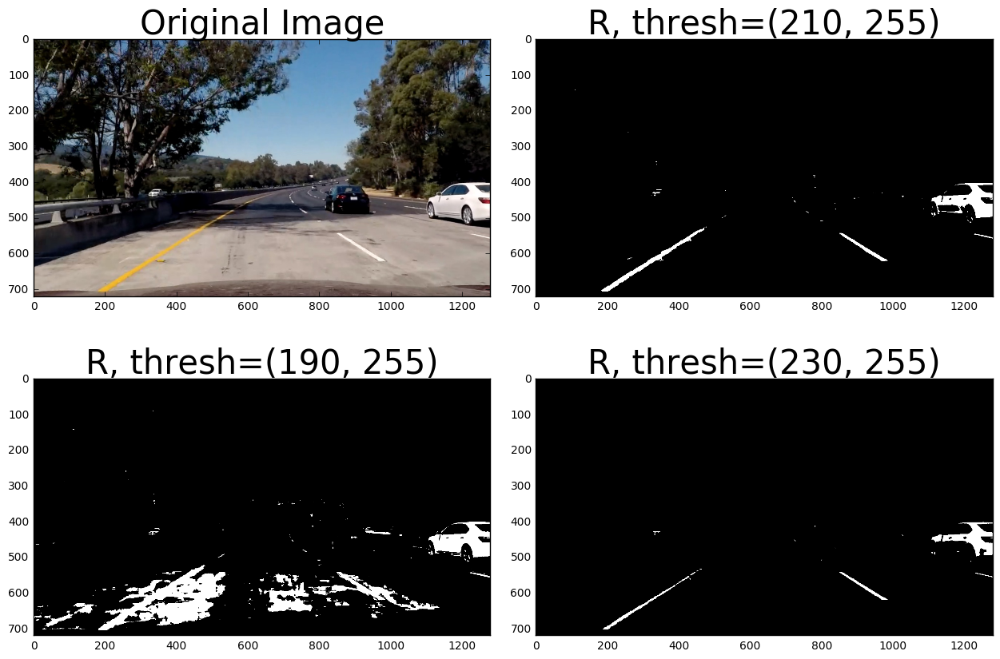

In [18]:
# Let's find out which S thresholds work best by comparing 3 ranges
image = mpimg.imread('test_images/test5.jpg')
image = cal_undistort(image)

print("Let's look at the best S thresholds")
S1 = hls_select(image, thresh=(120, 255))
S2 = hls_select(image, thresh=(100, 255))
S3 = hls_select(image, thresh=(80, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(2, 2, figsize=(12, 9))
f.tight_layout()
ax1[0].imshow(image)
ax1[0].set_title('Original Image', fontsize=30)
ax2[0].imshow(S1, cmap='gray')
ax2[0].set_title('S, thresh=(120, 255)', fontsize=30)
ax1[1].imshow(S2, cmap='gray')
ax1[1].set_title('S, thresh=(100, 255)', fontsize=30)
ax2[1].imshow(S3, cmap='gray')
ax2[1].set_title('S, thresh=(80, 255)', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

print("Let's look at the best R thresholds")
R1 = rgb_select(image, thresh=(190, 255))
R2 = rgb_select(image, thresh=(210, 255))
R3 = rgb_select(image, thresh=(230, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(2, 2, figsize=(12, 9))
f.tight_layout()
ax1[0].imshow(image)
ax1[0].set_title('Original Image', fontsize=30)
ax2[0].imshow(R1, cmap='gray')
ax2[0].set_title('R, thresh=(190, 255)', fontsize=30)
ax1[1].imshow(R2, cmap='gray')
ax1[1].set_title('R, thresh=(210, 255)', fontsize=30)
ax2[1].imshow(R3, cmap='gray')
ax2[1].set_title('R, thresh=(230, 255)', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

The R channel does not really look promising here. I'll stick with only using the S channel for now, using thresholds between 80 and 255.

Let's move on to using and adding the gradients as line detectors.

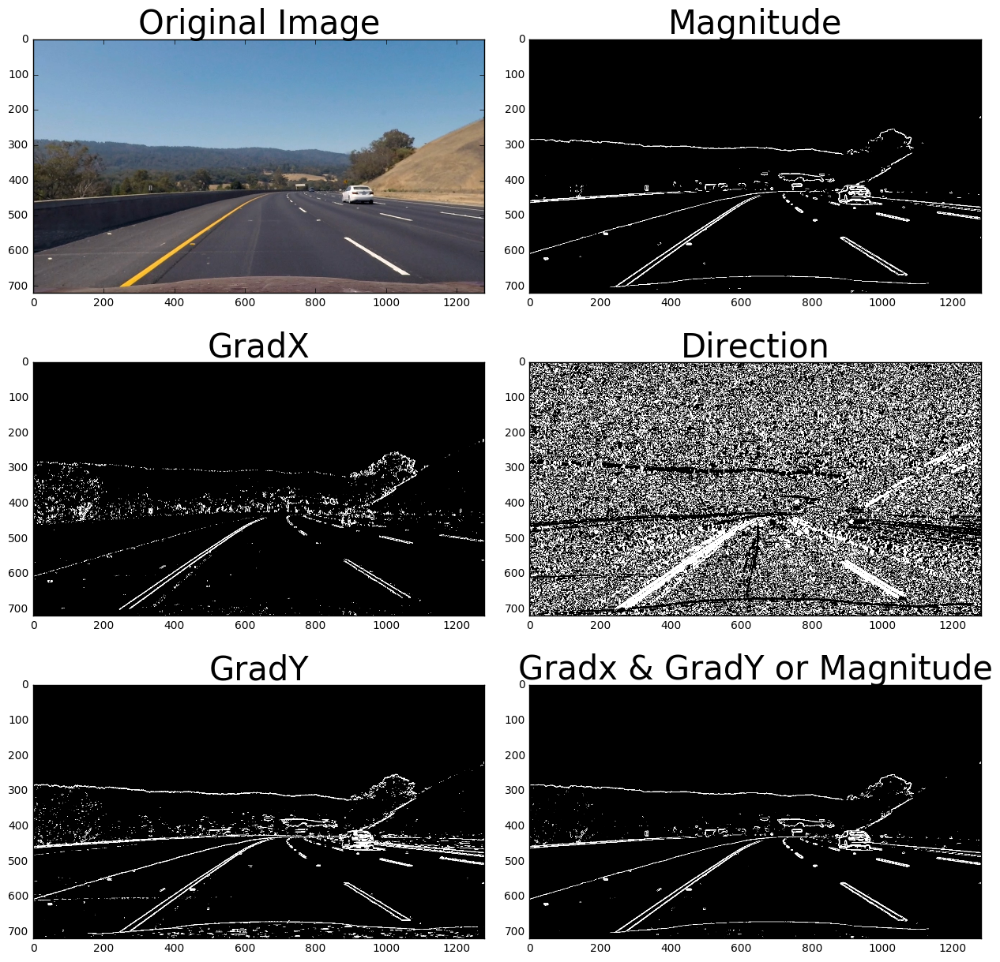

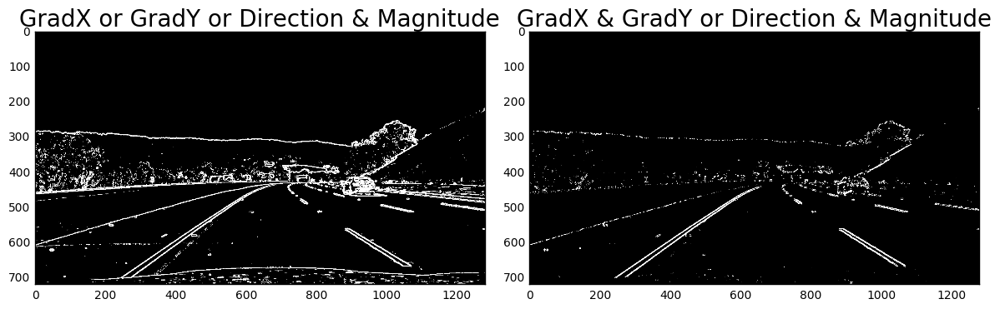

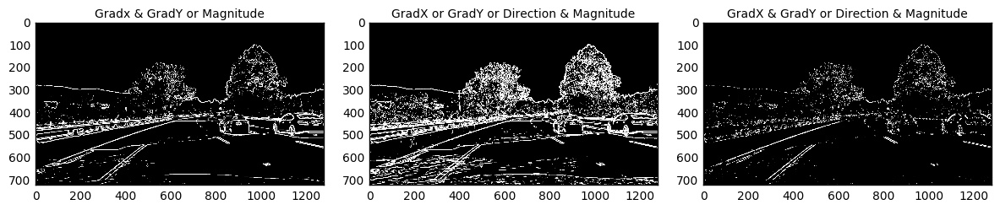

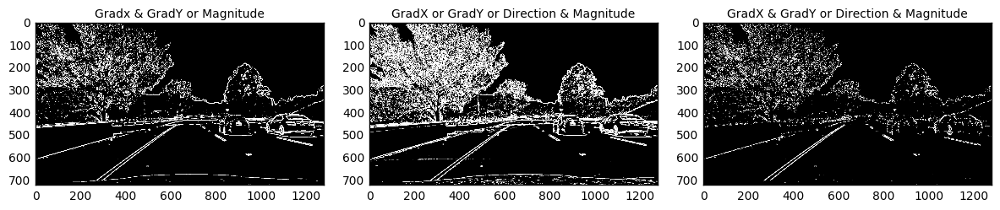

In [25]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

image = mpimg.imread('test_images/test3.jpg')
image = cal_undistort(image)
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

combined = np.zeros_like(dir_binary)
combined[(gradx == 1) & (grady == 1) | (mag_binary == 1)] = 1

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(3, 2, figsize=(12, 9))
f.tight_layout()
ax1[0].imshow(image)
ax1[0].set_title('Original Image', fontsize=30)
ax2[0].imshow(gradx, cmap='gray')
ax2[0].set_title('GradX', fontsize=30)
ax3[0].imshow(grady, cmap='gray')
ax3[0].set_title('GradY', fontsize=30)
ax1[1].imshow(mag_binary, cmap='gray')
ax1[1].set_title('Magnitude', fontsize=30)
ax2[1].imshow(dir_binary, cmap='gray')
ax2[1].set_title('Direction', fontsize=30)
ax3[1].imshow(combined, cmap='gray')
ax3[1].set_title('Gradx & GradY or Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=1.3, bottom=0.)
plt.show()

combined2 = np.zeros_like(dir_binary)
combined2[((gradx == 1) | (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
combined3 = np.zeros_like(dir_binary)
combined3[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 9))
f.tight_layout()
ax1.imshow(combined2, cmap='gray')
ax1.set_title('GradX or GradY or Direction & Magnitude', fontsize=20)
ax2.imshow(combined3, cmap='gray')
ax2.set_title('GradX & GradY or Direction & Magnitude', fontsize=20)
plt.show()

# Test it on one more image
image = mpimg.imread('test_images/test4.jpg')
image = cal_undistort(image)
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

combined = np.zeros_like(dir_binary)
combined[(gradx == 1) & (grady == 1) | (mag_binary == 1)] = 1
combined2 = np.zeros_like(dir_binary)
combined2[((gradx == 1) | (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
combined3 = np.zeros_like(dir_binary)
combined3[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 9))
f.tight_layout()
ax1.imshow(combined, cmap='gray')
ax1.set_title('Gradx & GradY or Magnitude', fontsize=10)
ax2.imshow(combined2, cmap='gray')
ax2.set_title('GradX or GradY or Direction & Magnitude', fontsize=10)
ax3.imshow(combined3, cmap='gray')
ax3.set_title('GradX & GradY or Direction & Magnitude', fontsize=10)
plt.show()


# Test it on one more image
image = mpimg.imread('test_images/test6.jpg')
image = cal_undistort(image)
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

combined = np.zeros_like(dir_binary)
combined[(gradx == 1) & (grady == 1) | (mag_binary == 1)] = 1
combined2 = np.zeros_like(dir_binary)
combined2[((gradx == 1) | (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
combined3 = np.zeros_like(dir_binary)
combined3[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 9))
f.tight_layout()
ax1.imshow(combined, cmap='gray')
ax1.set_title('Gradx & GradY or Magnitude', fontsize=10)
ax2.imshow(combined2, cmap='gray')
ax2.set_title('GradX or GradY or Direction & Magnitude', fontsize=10)
ax3.imshow(combined3, cmap='gray')
ax3.set_title('GradX & GradY or Direction & Magnitude', fontsize=10)
plt.show()


What I see above is that "GradX or GradY or Direction & Magnitude" is great at picking up lanes far into the horizon. But in more noisy images, it's also great at picking up shadow, so I don't want to use that.

The performance of "GradX & GradY or Magnitude" is slightly better than the performance of "GradX & GradY or Direction & Magnitude" at picking up lanes, but it is also better at picking up noise. That's why I conclude that I'll use "GradX & GradY or Direction & Magnitude" in the following.

Let's merge the S channel and "GradX & GradY or Direction & Magnitude" now.

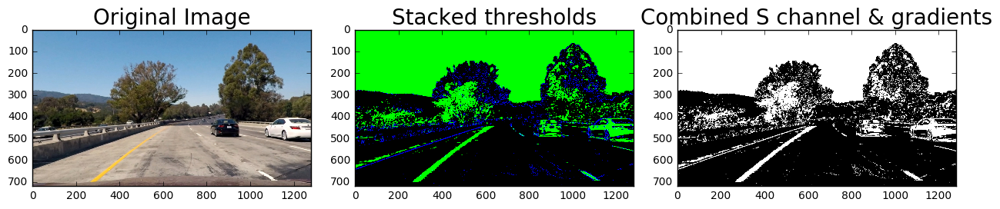

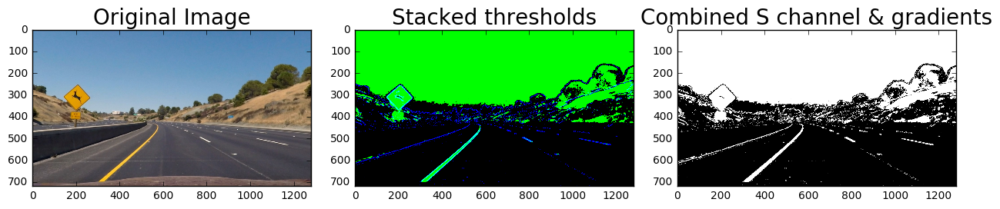

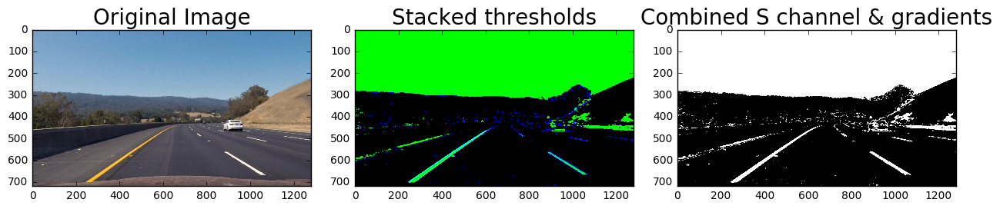

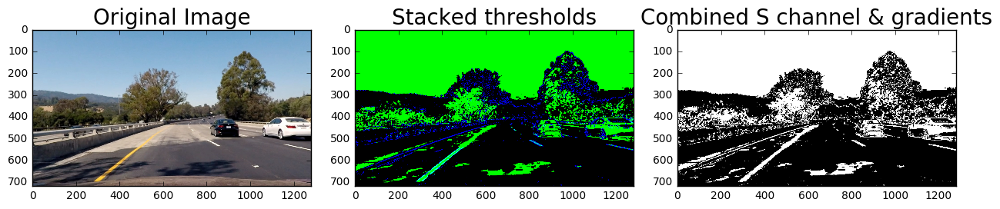

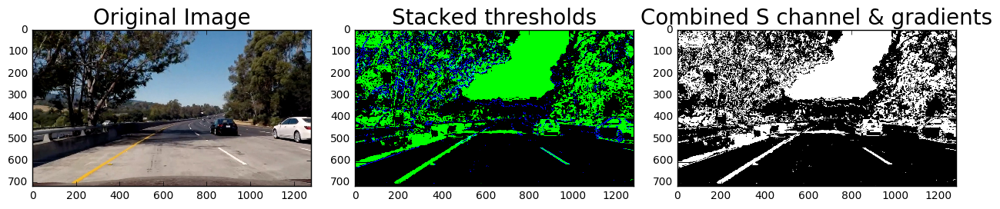

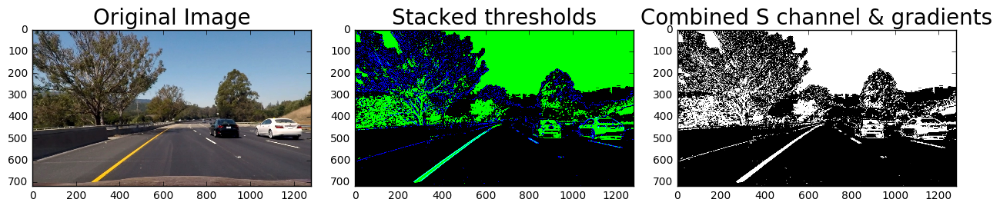

In [26]:
# Let's find out which S thresholds work best by comparing 3 ranges
image_paths = glob.glob('test_images/test*.jpg')

# Merges S channel and "GradX & GradY or Direction & Magnitude" filters
def filter_lanes(img):
    S = hls_select(img, thresh=(80, 255))

    ksize = 3 # Choose a larger odd number to smooth gradient measurements
    gradx = abs_sobel_thresh(img, orient='x', sobel_kernel=ksize, thresh=(20, 150))
    grady = abs_sobel_thresh(img, orient='y', sobel_kernel=ksize, thresh=(20, 255))
    mag_binary = mag_thresh(img, sobel_kernel=7, thresh=(50, 200))
    dir_binary = dir_threshold(img, sobel_kernel=15, thresh=(0.6, 1.3))

    combined_gradient = np.zeros_like(dir_binary)
    combined_gradient[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(S), S, combined_gradient))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(S)
    combined_binary[(S == 1) | (combined_gradient == 1)] = 1
    
    return combined_binary, color_binary
    

for img_path in image_paths:
    image = mpimg.imread(img_path)
    image = cal_undistort(image)
    combined_binary, color_binary = filter_lanes(image)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(color_binary, cmap='gray')
    ax2.set_title('Stacked thresholds', fontsize=20)
    ax3.imshow(combined_binary, cmap='gray')
    ax3.set_title('Combined S channel & gradients', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## Apply perspective transform to rectify binary image (bird's eye view)

In order to perform the perspective transform, we need to pick source points (from the cameras view) and the corresponding desired points in the bird view. This can be done by taking an image where the lanes are straight, and manually choose the points from the original and on the original destination image that does not exist yet. These points will define the perspective transform.

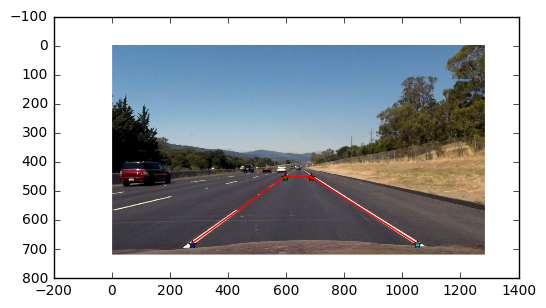

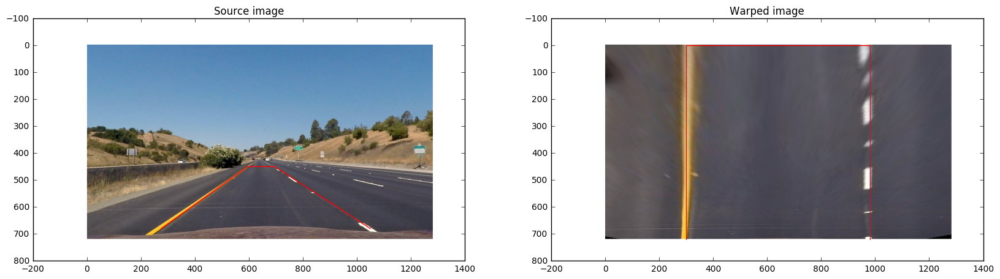

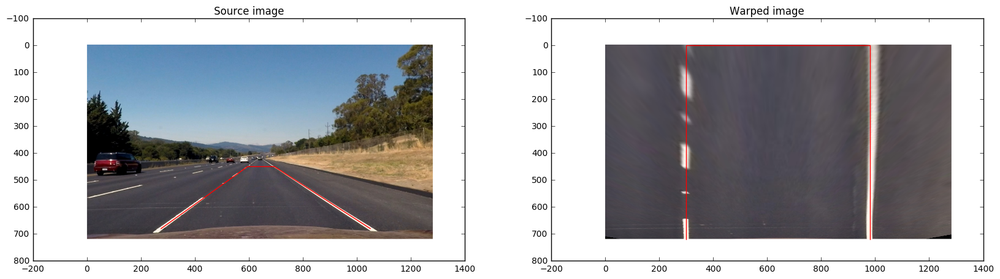

In [29]:
image = mpimg.imread('test_images/straight_lines2.jpg')
image = cal_undistort(image)
plt.imshow(image)

# source image points
plt.plot(275, 680, '*') # bottom left
plt.plot(595, 450, '*') # top left
plt.plot(687, 450, '*') # top right
plt.plot(1050, 680, '*') # bottom right

points = [[275, 680], [595, 450], [687, 450], [1050, 680]]
x = [p[0] for p in points]
y = [p[1] for p in points]
plt.plot(x, y, color='red')
plt.show

# Define perspective transform function 
def warp(img, reverse=False):
    # Define calibration box in source (original) and destination (desired
    # or warped) coordinates
    img_size = (img.shape[1], img.shape[0])

    src = np.float32([[275, 680],
                    [595, 450],
                    [687, 450],
                    [1050, 680]])
    width = img_size[0]
    height = img_size[1]
    offset = 300
    dst = np.float32([[offset, height],
                    [offset, 0],
                    [width - offset, 0],
                    [width - offset, height]])
    
    # Compute the perspective transform, M, given source and destination points
    # Takes in our four source points, and our four destination points
    # And it returns the mapping as a perspective matrix.
    if reverse:
        M = cv2.getPerspectiveTransform(dst, src)
    else: 
        M = cv2.getPerspectiveTransform(src, dst)

    # Create warped image - uses linear interpolation
    # How to interpolate points: just fill in missing points as it warps the image
    # here: linear interpolation
    # Warp an image using the perspective transform, M
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    return warped


image_paths = glob.glob('test_images/straight_lines*.jpg')

for img_path in image_paths:
    image = mpimg.imread(img_path)
    image = cal_undistort(image)
    warped_im = warp(image)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title('Source image')
    ax1.imshow(image)
    
    points = [[275, 680], [595, 450], [695, 450], [1050, 680]]
    x = [p[0] for p in points]
    y = [p[1] for p in points]
    ax1.plot(x, y, color='red')
    
    ax2.set_title('Warped image')
    ax2.imshow(warped_im)
    
    img_size = (image.shape[1], image.shape[0])
    width = img_size[0]
    height = img_size[1]
    offset = 300
    points = [[offset, height],
        [offset, 0],
        [width - offset, 0],
        [width - offset, height]]
    x = [p[0] for p in points]
    y = [p[1] for p in points]
    ax2.plot(x, y, color='red')

This looks about right! Let's see how that looks like for binary images.

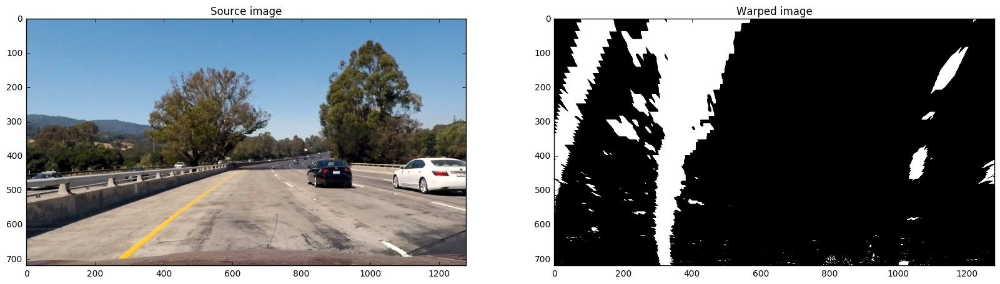

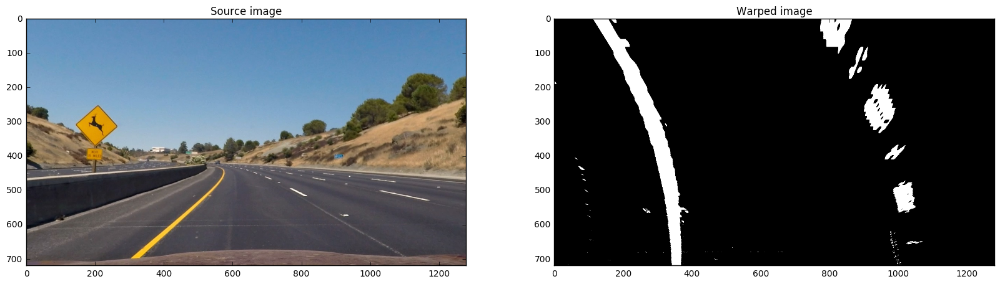

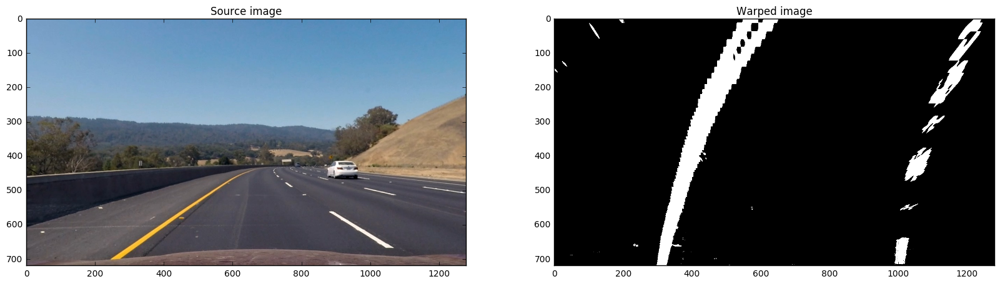

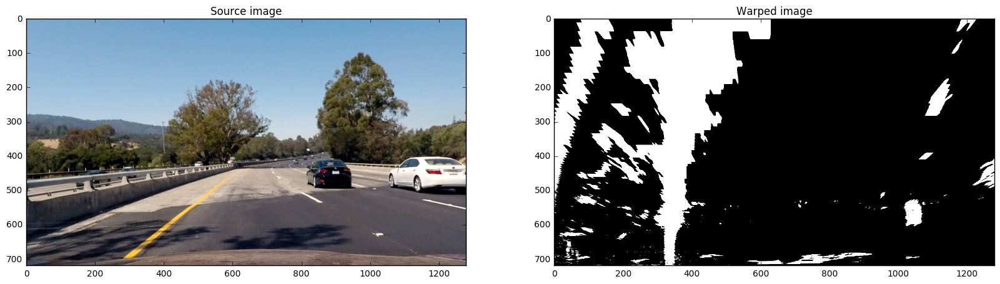

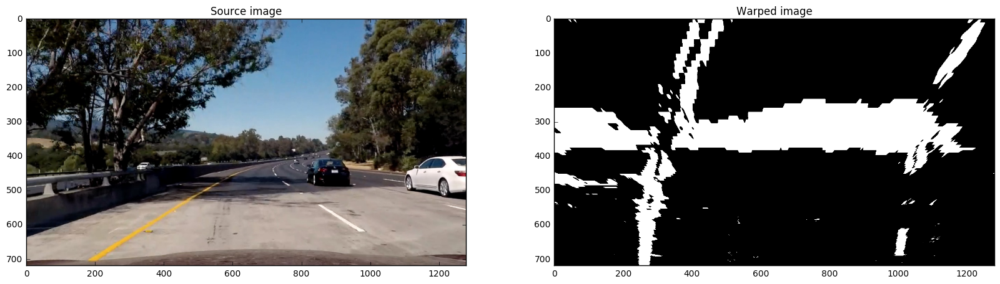

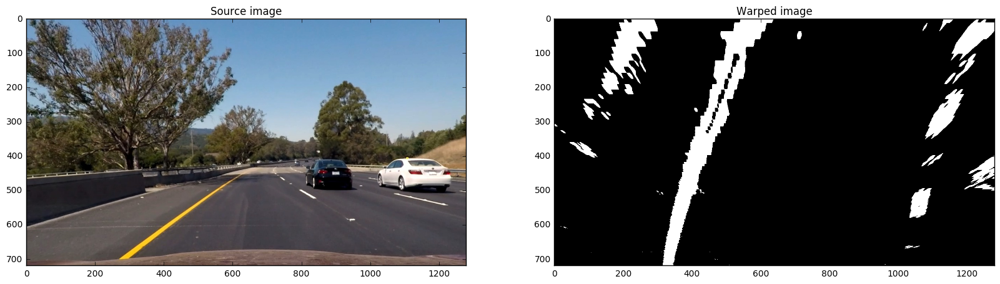

In [30]:
image_paths = glob.glob('test_images/test*.jpg')

for img_path in image_paths:
    image = mpimg.imread(img_path)
    image = cal_undistort(image)
    combined_binary, color_binary = filter_lanes(image)
    warped_im = warp(combined_binary)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.set_title('Source image')
    ax1.imshow(image)
    ax2.set_title('Warped image')
    ax2.imshow(warped_im, cmap='gray')

## Locate the Lane Lines & Fit a Polynomial

Now that we have a warped binary image, where the lane lines clearly stand out, we use a histogram and sliding windows as a lane finding method.

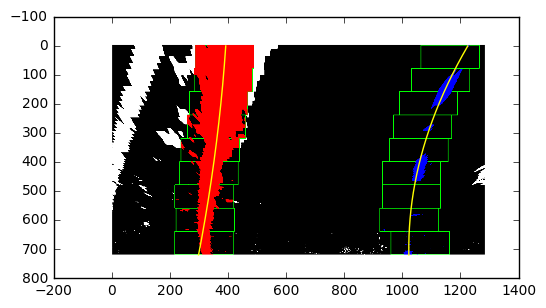

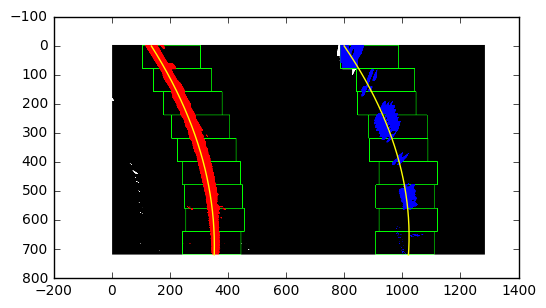

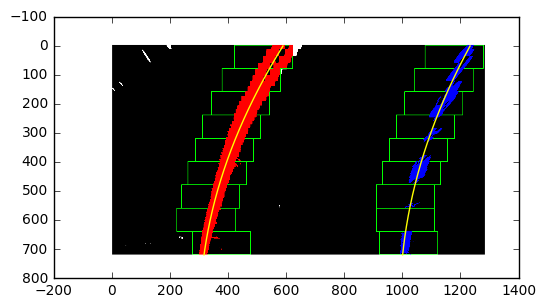

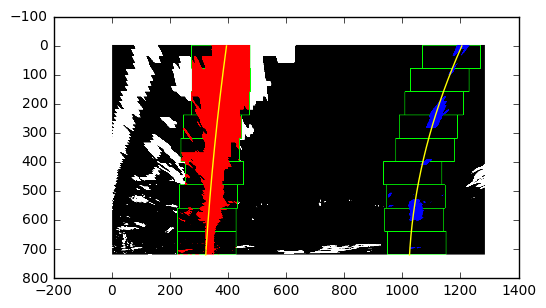

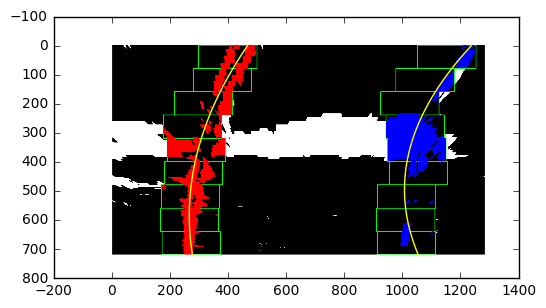

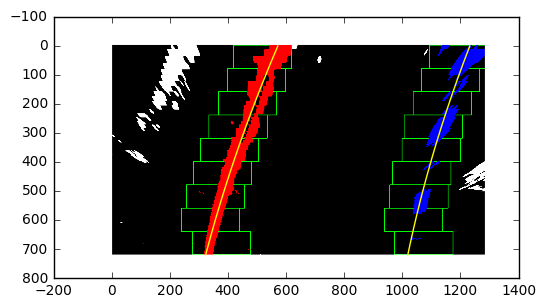

In [31]:
test_image = mpimg.imread('test_images/test1.jpg')
image = cal_undistort(image)
combined_bin, color_bin = filter_lanes(test_image)
warped_img = warp(combined_bin)

def detect_lines(warped_img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped_img[warped_img.shape[0]/2:,:], axis=0)

    # Create an output image to draw on and visualize the result
    out_img = np.dstack((warped_img, warped_img, warped_img))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left & right lanes
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(warped_img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current position to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set the minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_img.shape[0] - (window+1)*window_height
        win_y_high = warped_img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Calculate curvature
    # Correct for scale in x & y:
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = warped_img.shape[0]
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    # print(left_curverad, 'm', right_curverad, 'm')
    
    width = warped_img.shape[1]
    height = warped_img.shape[0]
    # Calculate vehicle position with respect to center
    left_lane_pos = left_fit[0]*height**2 + left_fit[1]*height + left_fit[2]
    right_lane_pos = right_fit[0]*height**2 + right_fit[1]*height + right_fit[2]
    # print("left_lane_pos: " + str(left_lane_pos))
    # print("right_lane_pos: " + str(right_lane_pos))
    
    car_pos = width / 2
    middle_lane_pos = left_lane_pos + (right_lane_pos - left_lane_pos) / 2
    car_offset = (middle_lane_pos - car_pos) * xm_per_pix
    # print("car_offset: " + str(car_offset))
    
    return left_fit, right_fit, left_curverad, right_curverad, car_offset, out_img


image_paths = glob.glob('test_images/test*.jpg')

for i, img_path in enumerate(image_paths):
    image = mpimg.imread(img_path)
    image = cal_undistort(image)
    combined_binary, color_binary = filter_lanes(image)
    warped_img = warp(combined_binary)
    left_fit, right_fit, left_curverad, right_curverad, car_offset, out_img = detect_lines(warped_img)
            
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    plt.figure()
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')


Let's put everything into a pipeline to detect and mark lanes!

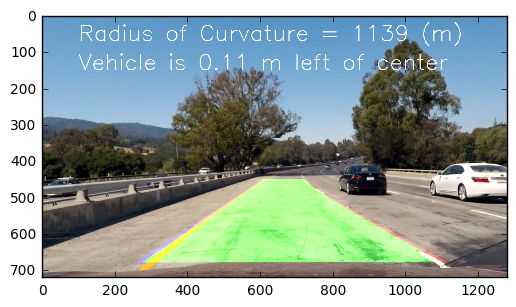

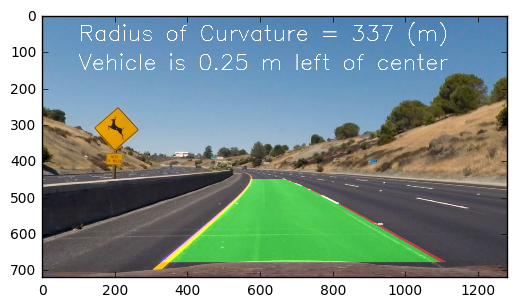

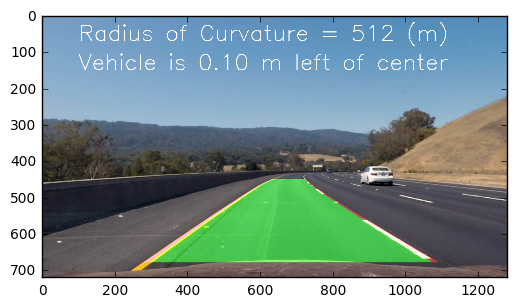

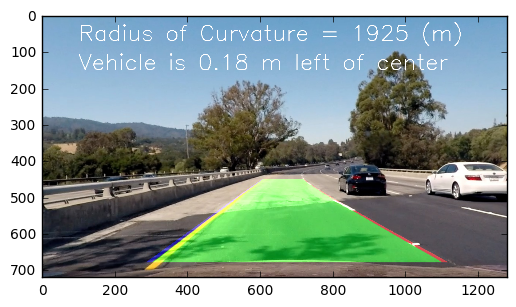

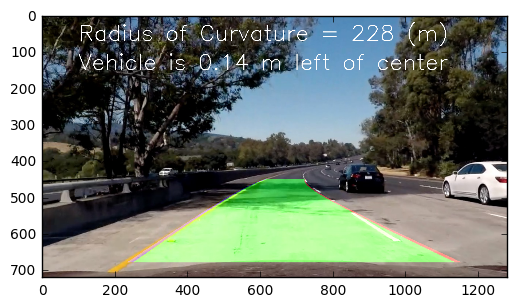

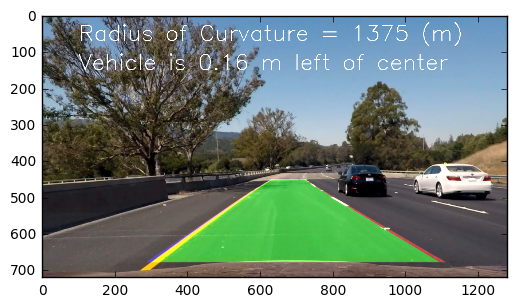

In [34]:
# Pipeline to detect lanes
def lane_finding(img):
    img = cal_undistort(img)
    combined_binary, color_binary = filter_lanes(img)
    warped_img = warp(combined_binary)
    left_fit, right_fit, left_curverad, right_curverad, car_offset, out_img = detect_lines(warped_img)
    
    # f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    # ax1.set_title('Source img')
    # ax1.imshow(img)
    # ax2.set_title('Warped image')
    # ax2.imshow(warped_img, cmap='gray')
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # draw curves onto image
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    left_poly_points = np.array([[left_fitx[y], y] for y in np.arange(720)])
    right_poly_points = np.array([[right_fitx[y], y] for y in np.arange(719,0,-1)])

    fitted_lanes = np.concatenate((left_poly_points, right_poly_points))    
    cv2.polylines(color_warp, np.int_([left_poly_points]), False, (0, 0, 255), 30)
    cv2.polylines(color_warp, np.int_([right_poly_points]), False, (255, 0, 0), 30)
    cv2.fillPoly(color_warp, np.int_([fitted_lanes]), (0, 255, 0))
    # plt.figure()
    # plt.imshow(color_warp)
    
    unwarped = warp(color_warp, reverse=True)
    result = cv2.addWeighted(unwarped, 0.5, img, 1, 0)
    average_curverad = (left_curverad + right_curverad) / 2
    
    radius_text = "Radius of Curvature = {:d} (m)".format(int(average_curverad))
    cv2.putText(result, radius_text, (100, 70), cv2.FONT_HERSHEY_SIMPLEX, 2,  
                (255, 255, 255), 2 )
    
    # print(car_offset)
    if car_offset < 0:
        direction = "right"
    else:
        direction = "left"
    offset_text = "Vehicle is {:.2f} m ".format(car_offset) + direction + " of center"
    cv2.putText(result, offset_text, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 2,  
                (255, 255, 255), 2 )

    return result
    
image_paths = glob.glob('test_images/test*.jpg')

for img_path in image_paths:
    image = mpimg.imread(img_path)
    lanes = lane_finding(image)
    plt.figure()
    plt.imshow(lanes)

Let's try this on all the videos!

In [36]:
# clip = VideoFileClip('project_video.mp4').subclip(0,5)
clip = VideoFileClip('project_video.mp4')
processed_vid = clip.fl_image(lane_finding)
%time processed_vid.write_videofile('processed_video.mp4', audio=False)

[MoviePy] >>>> Building video processed_video.mp4
[MoviePy] Writing video processed_video.mp4


100%|█████████▉| 1260/1261 [08:38<00:00,  2.57it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_video.mp4 

CPU times: user 8min 28s, sys: 1min 54s, total: 10min 23s
Wall time: 8min 39s


In [37]:
clip = VideoFileClip('challenge_video.mp4')
processed_vid = clip.fl_image(lane_finding)
%time processed_vid.write_videofile('processed_challenge_video.mp4', audio=False)

[MoviePy] >>>> Building video processed_challenge_video.mp4
[MoviePy] Writing video processed_challenge_video.mp4


100%|██████████| 485/485 [03:06<00:00,  2.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_challenge_video.mp4 

CPU times: user 3min 6s, sys: 41.9 s, total: 3min 48s
Wall time: 3min 7s


In [38]:
clip = VideoFileClip('harder_challenge_video.mp4')
processed_vid = clip.fl_image(lane_finding)
%time processed_vid.write_videofile('processed_harder_challenge_video.mp4', audio=False)

[MoviePy] >>>> Building video processed_harder_challenge_video.mp4
[MoviePy] Writing video processed_harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [08:14<00:00,  2.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: processed_harder_challenge_video.mp4 

CPU times: user 8min 17s, sys: 1min 45s, total: 10min 3s
Wall time: 8min 15s
